# Лабораторна робота №2

## Суміщення зображень на основі використання дескрипторів

Варіант - 10

Вибрати з інтернету набори зображень з різною контрастністю і різним флуктуаціями освітленості. Для кожного зображення побудувати варіант спотвореного (видозміненого зображення). Для кожної отриманої пари побудувати дескриптор і проаналізувати можливість суміщення цих зображень і з визначення параметрів геметричних перетворень (кут повороту, зміщень в напрямку х і напрямку y).

10. BRIEF

Для перевірки збігів необхідно написати власну функцію матчінгу, а результати її роботи перевірити засобами OpenCV. Якщо повної реалізації дескриптора не має в OpenCV, то такий необхідно створити власну функцію побудови цих дискрипторів. У цьому випадку матчінг можна здійснювати стандартними засобами (якщо це можливо).

Для дескрипторів, заснованих на бінарних рядках, таких як ORB, BRIEF, BRISK і т.д., треба використовувати метрику Хемінга (cv.NORM_HAMMING).

In [ ]:
# !pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [3]:
imgs = [cv.cvtColor(cv.imread(f, cv.IMREAD_COLOR), cv.COLOR_BGR2RGB) 
        for f in ['lab1_1.jpg', 'lab1_2.jpg', 'lab2_low_light.jpg', 'lab2_high_light.jpg']]

In [4]:
def show(img):
  plt.figure(figsize=(15, 5), dpi=150)
  plt.imshow(img)

In [5]:
def deform(img, x1, x2, y1, y2):
  return img[x1:x2, y1:y2]

In [6]:
def brief_bfmatcher(image, deformed, matches_number=7):
  
  brief = cv.xfeatures2d.BriefDescriptorExtractor_create()
  detector = cv.FastFeatureDetector_create()

  kp1 = detector.detect(cv.cvtColor(image, cv.COLOR_BGR2GRAY), None)
  kp2 = detector.detect(cv.cvtColor(deformed, cv.COLOR_BGR2GRAY), None)
  kp1, des1 = brief.compute(cv.cvtColor(image, cv.COLOR_BGR2GRAY), kp1)
  kp2, des2 = brief.compute(cv.cvtColor(deformed, cv.COLOR_BGR2GRAY), kp2)

  bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
  matches = bf.match(des1, des2)

  matches = sorted(matches, key=lambda x: x.distance)

  return cv.drawMatches(image, kp1, deformed, kp2, matches[:matches_number], None, flags=2)

In [15]:
def brief_custom_matcher(image, deformed, matches_number=7):

  brief = cv.xfeatures2d.BriefDescriptorExtractor.create()
  detector = cv.FastFeatureDetector_create()

  kp1 = detector.detect(cv.cvtColor(image, cv.COLOR_BGR2GRAY), None)
  kp2 = detector.detect(cv.cvtColor(deformed, cv.COLOR_BGR2GRAY), None)
  kp1, des1 = brief.compute(cv.cvtColor(image, cv.COLOR_BGR2GRAY), kp1)
  kp2, des2 = brief.compute(cv.cvtColor(deformed, cv.COLOR_BGR2GRAY), kp2)

  matches = []
  for i, d1 in enumerate(des1, start=0):
    for j, d2 in enumerate(des2, start=0):
      matches.append(cv.DMatch(_trainIdx=j, _queryIdx=i, _distance=float(np.sum(d1 ^ d2)), _imgIdx=0))

  matches = sorted(matches, key=lambda x: x.distance)
  
  return cv.drawMatches(image, kp1, deformed, kp2, matches[:matches_number], None, flags=2)


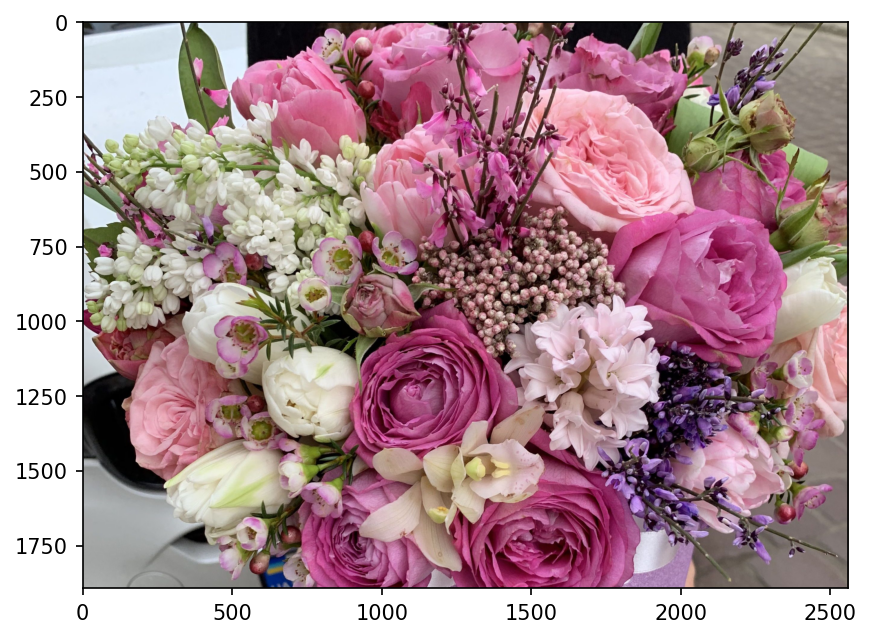

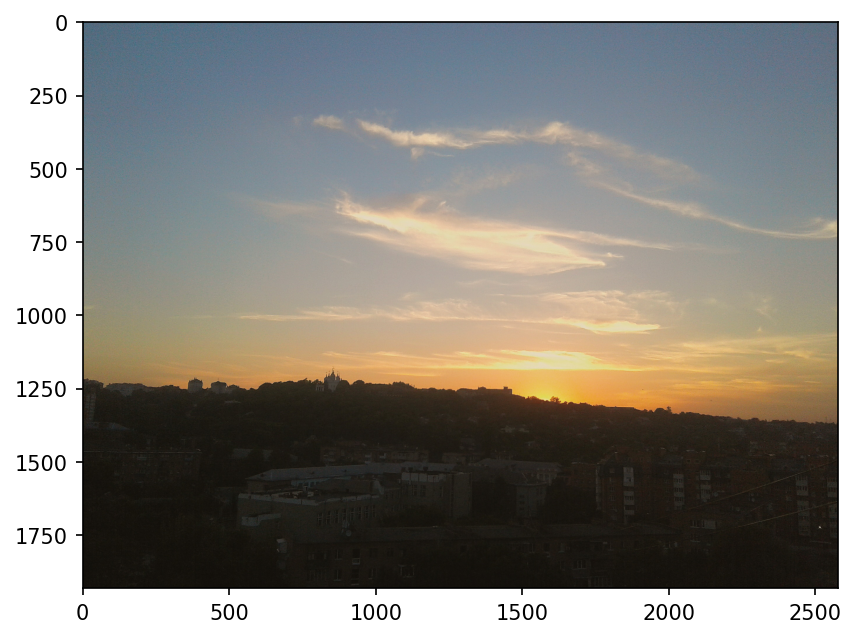

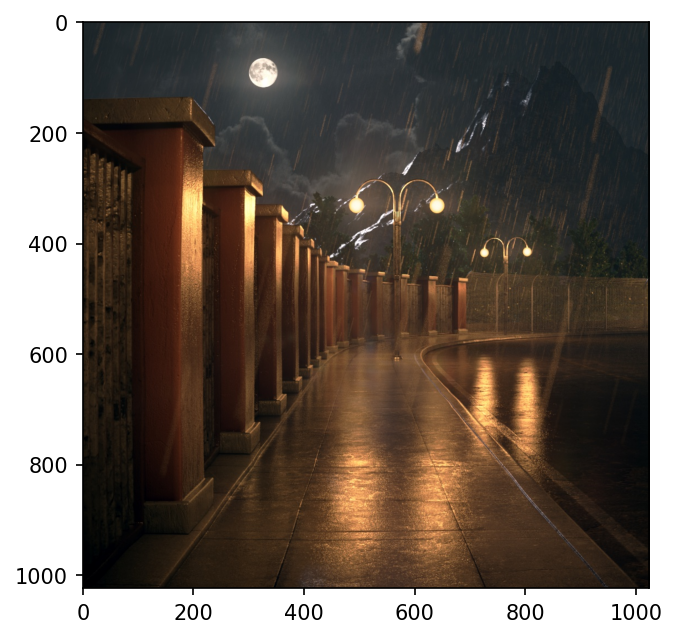

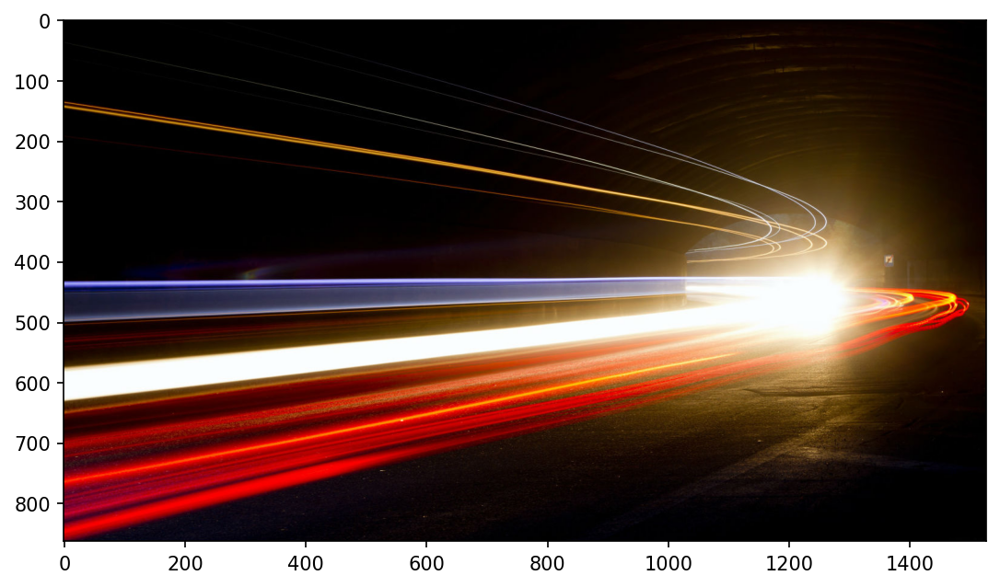

In [8]:
for img in imgs:
  show(img)

In [9]:
deform_imgs = []
deform_imgs.append(deform(imgs[0], 300, 800, 100, 600))
deform_imgs.append(deform(imgs[1], 900, 1400, 1400, 1900))
deform_imgs.append(deform(imgs[2], 100, 400, 100, 400))
deform_imgs.append(deform(imgs[3], 400, 700, 100, 400))

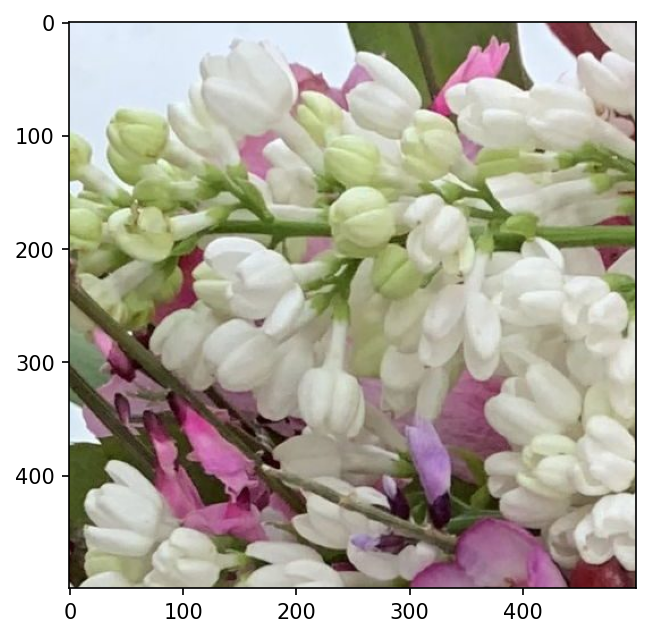

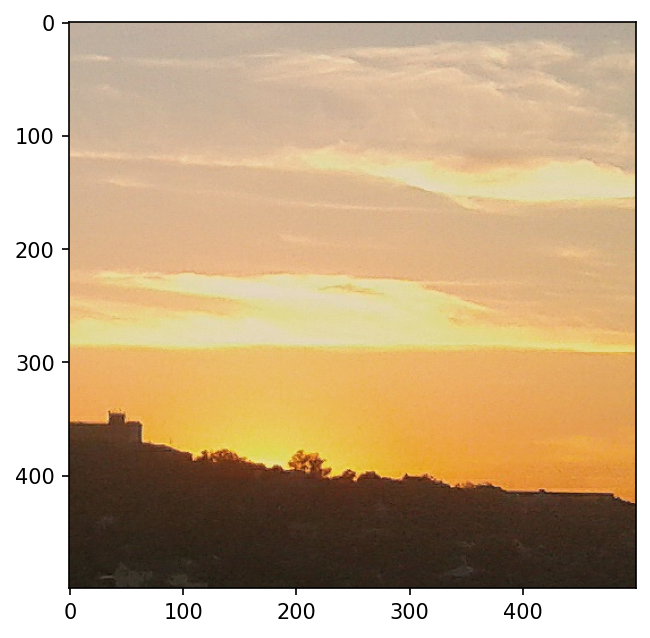

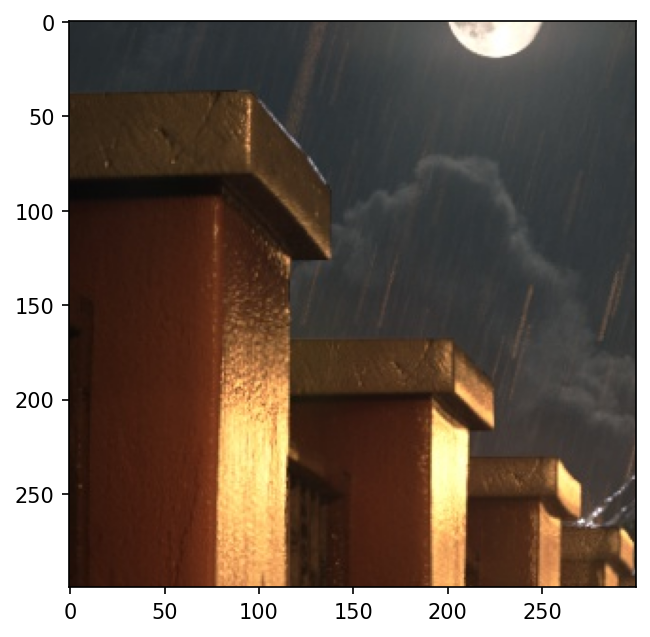

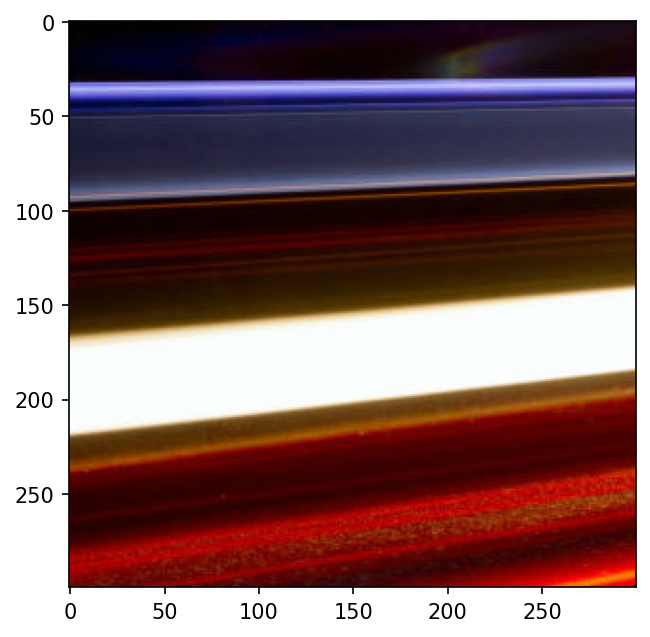

In [10]:
for img in deform_imgs:
  show(img)

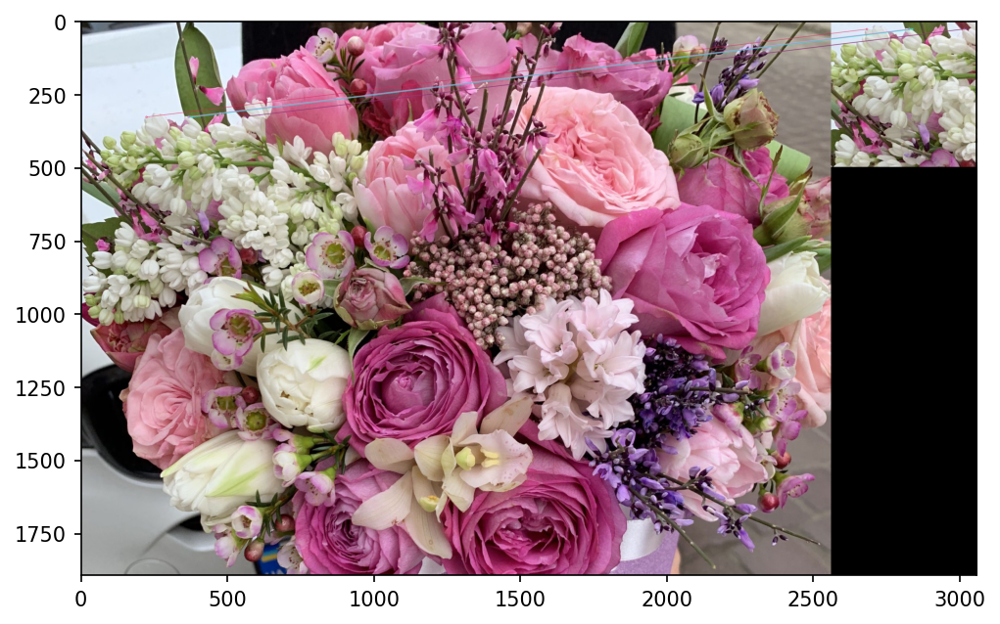

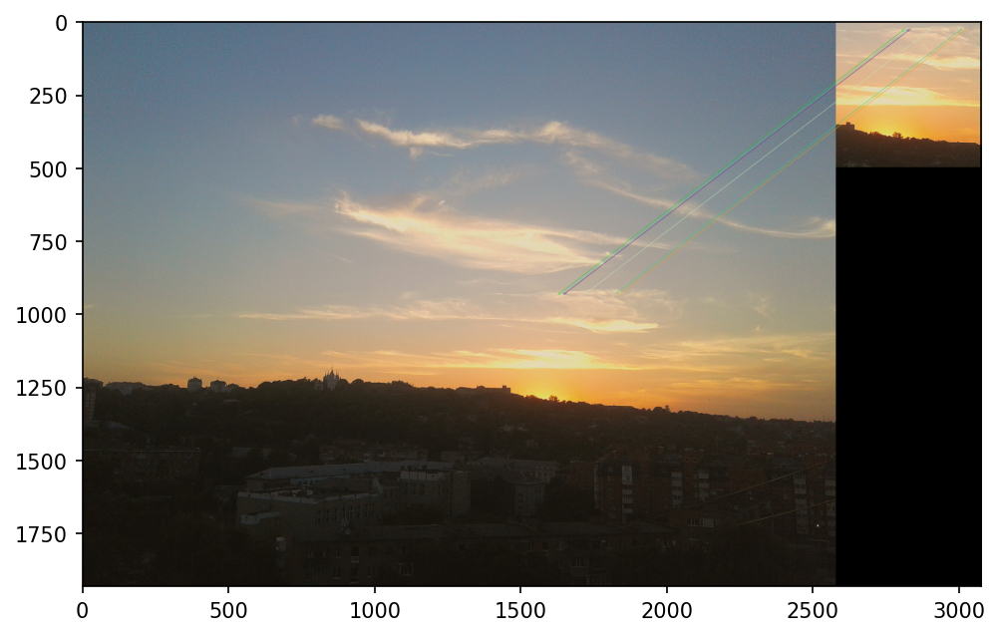

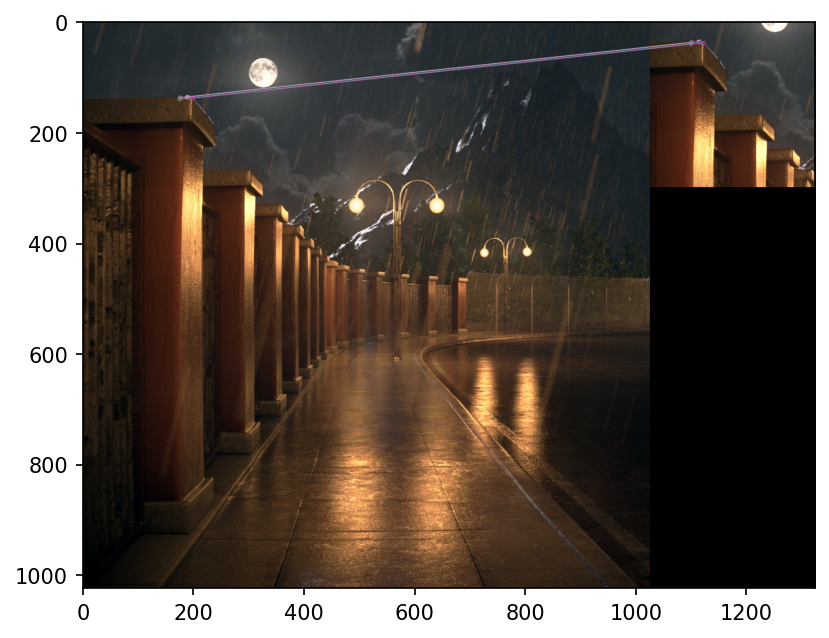

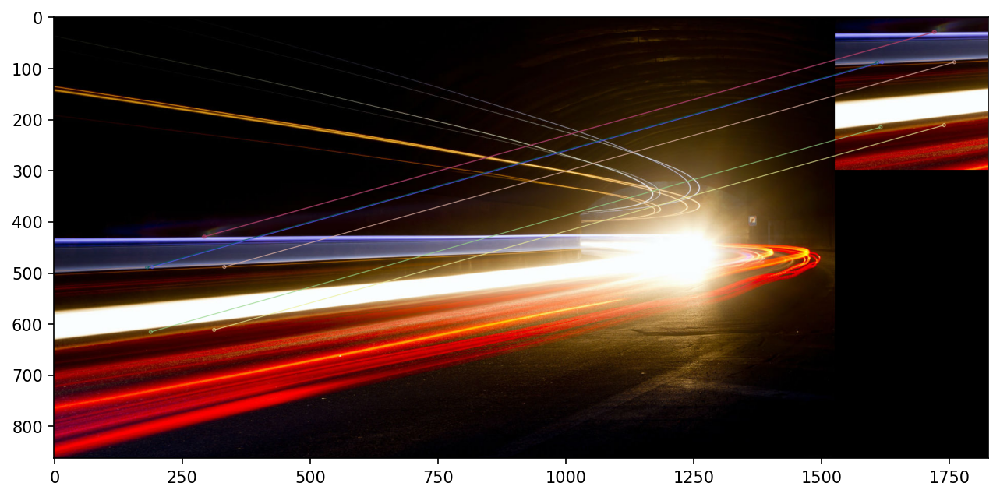

In [11]:
show(brief_bfmatcher(image=imgs[0], deformed=deform_imgs[0], matches_number=7))
show(brief_bfmatcher(image=imgs[1], deformed=deform_imgs[1], matches_number=7))
show(brief_bfmatcher(image=imgs[2], deformed=deform_imgs[2], matches_number=7))
show(brief_bfmatcher(image=imgs[3], deformed=deform_imgs[3], matches_number=7))

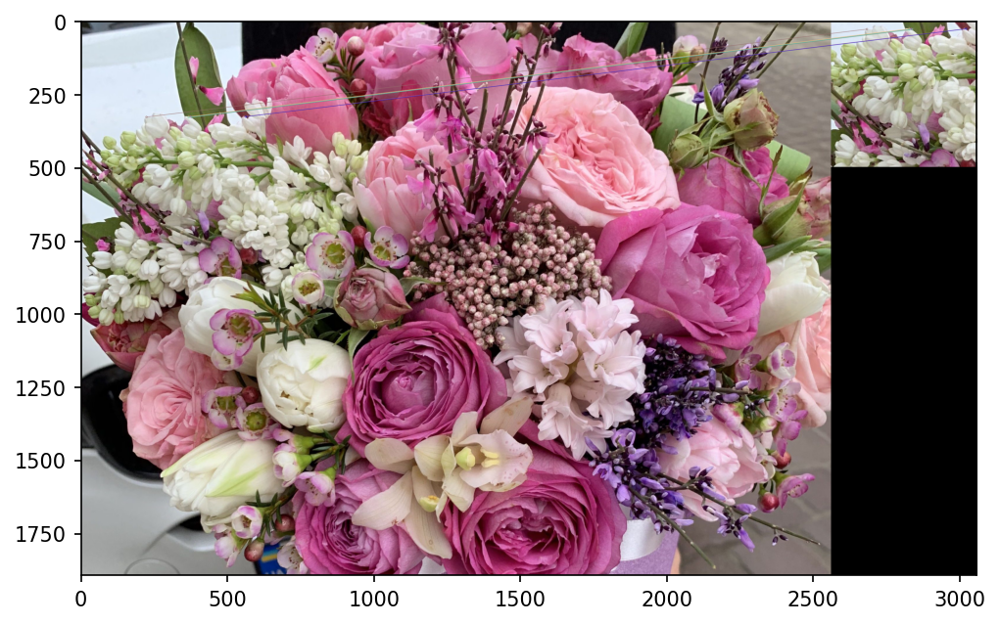

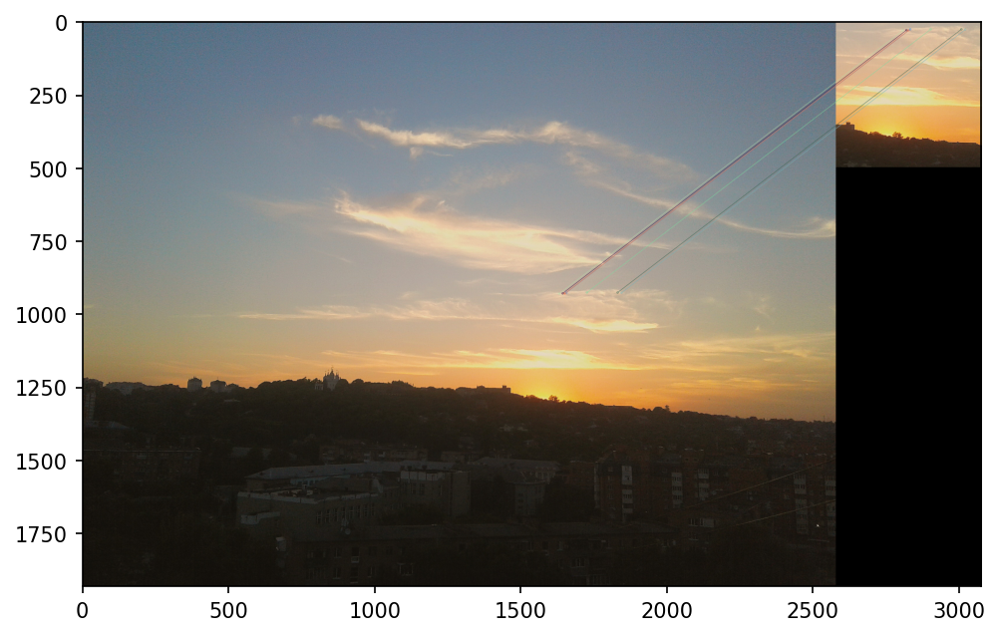

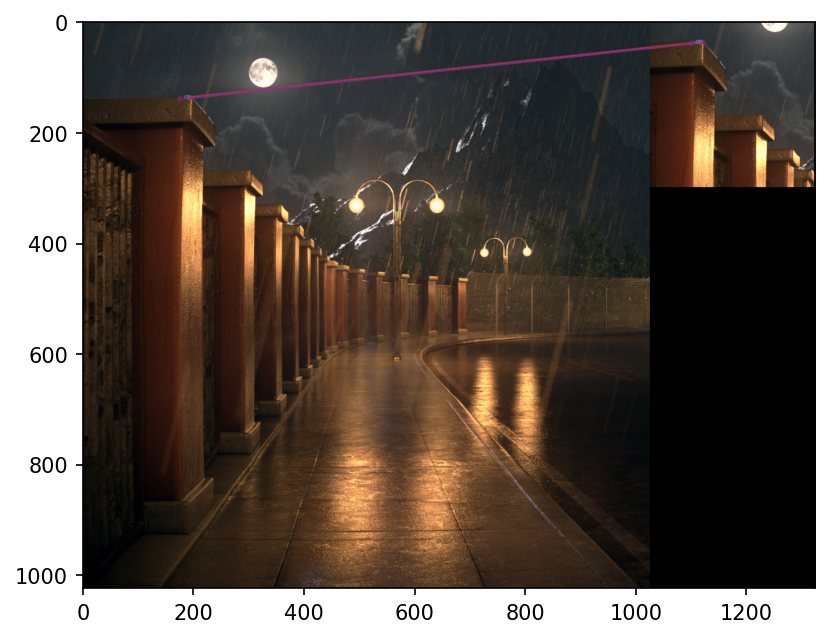

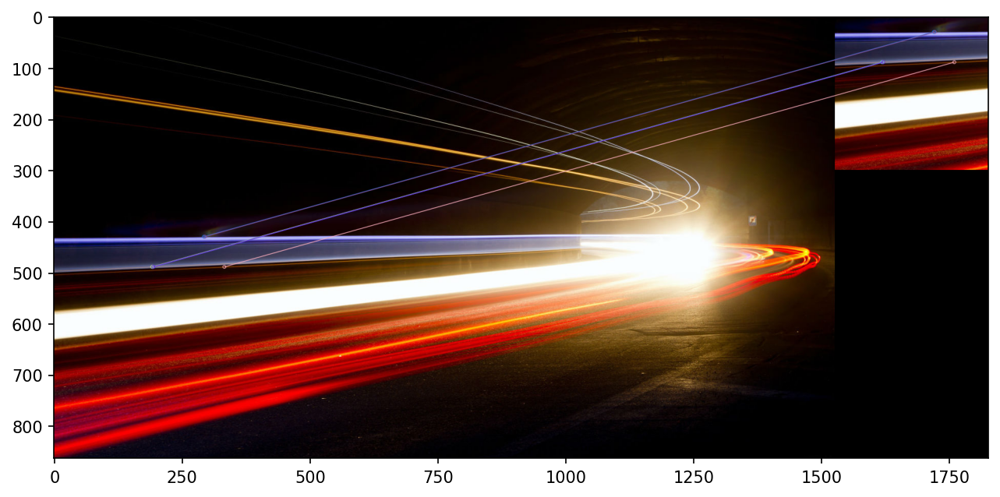

In [16]:
show(brief_custom_matcher(image=imgs[0], deformed=deform_imgs[0], matches_number=7))
show(brief_custom_matcher(image=imgs[1], deformed=deform_imgs[1], matches_number=7))
show(brief_custom_matcher(image=imgs[2], deformed=deform_imgs[2], matches_number=7))
show(brief_custom_matcher(image=imgs[3], deformed=deform_imgs[3], matches_number=7))